📘 Converting multi-class COCO masks → binary masks for 20 samples...


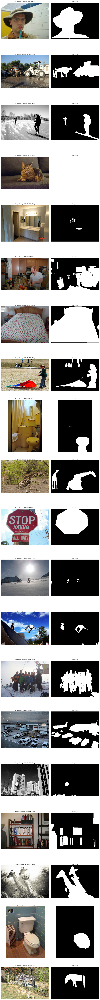


✅ Task 3 complete: 20 multi-class masks converted into binary masks successfully!


In [12]:

#TASK 3 – Binary Mask Conversion (20 samples)


import numpy as np
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import random

# Using the same COCO annotation file & sampled_images list from previous task
print("📘 Converting multi-class COCO masks → binary masks for 20 samples...")

def create_binary_mask(img_id, width, height, category_filter=None):
    """
    Converts all segmentation polygons for a given image_id
    into a single binary mask (foreground=1, background=0)
    """
    mask = Image.new("L", (width, height), 0)
    draw = ImageDraw.Draw(mask)
    
    for ann in annotations:
        if ann["image_id"] == img_id:
            # Filter if needed: for example, only keep 'person' category
            if category_filter and ann["category_id"] != category_filter:
                continue

            segs = ann.get("segmentation", [])
            if isinstance(segs, list):
                for seg in segs:
                    if len(seg) > 4:
                        poly = [(seg[i], seg[i + 1]) for i in range(0, len(seg), 2)]
                        draw.polygon(poly, outline=1, fill=1)
    return mask


# Process 20 random samples

binary_samples = random.sample(sampled_images, 20)

fig, axes = plt.subplots(20, 2, figsize=(10, 100))
fig.subplots_adjust(hspace=0.2)

for idx, img_info in enumerate(binary_samples):
    img_path = os.path.join(train_dir, img_info["file_name"])
    if not os.path.exists(img_path):
        continue

    # Load image
    img = Image.open(img_path).convert("RGB")

    # Create binary mask
    binary_mask = create_binary_mask(img_info["id"], img_info["width"], img_info["height"])

    # Display
    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f"Original Image: {img_info['file_name']}", fontsize=8)
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(binary_mask, cmap="gray")
    axes[idx, 1].set_title("Binary Mask", fontsize=8)
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()

print("\n✅ Task 3 complete: 20 multi-class masks converted into binary masks successfully!")


⚙️ Converting 20 masks into binary format...
✅ Binary conversion complete!


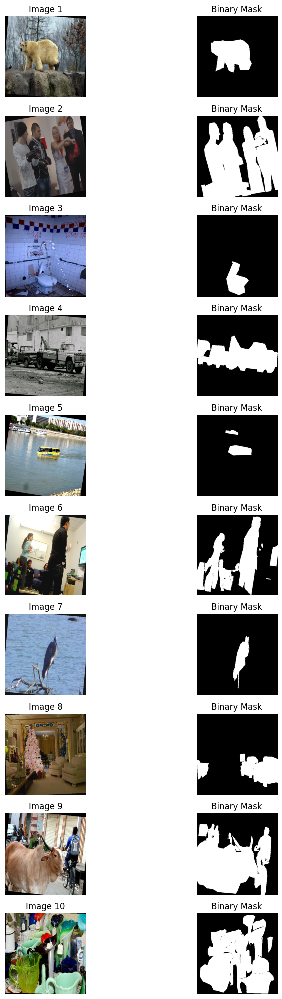


🟢 Task 3 – Binary Mask Conversion & Visualization complete!


In [13]:

# Task 3 – Binary Mask Conversion & Visualization


import numpy as np
from PIL import ImageOps


#  Function to convert multi-class mask → binary mask

def to_binary_mask(mask_tensor):
    """
    Converts a multi-class (multi-value) mask tensor to binary:
    object pixels → 1, background → 0
    """
    # Convert mask to NumPy
    mask_np = mask_tensor.squeeze().numpy()
    
    # Any nonzero pixel is object (white)
    binary_np = (mask_np > 0).astype(np.float32)
    
    # Convert back to tensor shape [1, H, W]
    binary_tensor = torch.tensor(binary_np).unsqueeze(0)
    return binary_tensor


# Apply binary conversion to 20 validation samples

print("⚙️ Converting 20 masks into binary format...")

binary_samples = []
for i in range(20):   # same number of images used in Task 2
    img, mask = dataset[i]         # from your Task 2 dataset
    binary_mask = to_binary_mask(mask)
    binary_samples.append((img, binary_mask))

print("✅ Binary conversion complete!")


#  Visualize results

def visualize_binary_masks(samples, n=10):
    plt.figure(figsize=(10, n * 2))
    for i in range(n):
        img, mask = samples[i]
        plt.subplot(n, 2, 2 * i + 1)
        plt.imshow(img.permute(1, 2, 0))
        plt.title(f"Image {i+1}")
        plt.axis("off")

        plt.subplot(n, 2, 2 * i + 2)
        plt.imshow(mask.squeeze(), cmap="gray")
        plt.title("Binary Mask")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_binary_masks(binary_samples, n=10)

print("\n🟢 Task 3 – Binary Mask Conversion & Visualization complete!")


🎨 Visualizing 20 image-mask pairs (original vs binary)...


100%|█████████████████████████████████████████████| 20/20 [01:34<00:00,  4.74s/it]


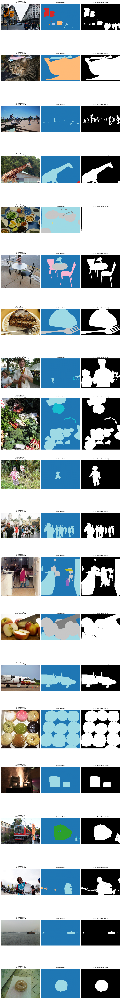


✅ Task 3 complete: 20 binary masks generated and visualized!


In [14]:
# Project - Task 3: Binary Mask Conversion

import os, random, json
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# Paths

base_dir = r"D:\COCO2017"
train_dir = os.path.join(base_dir, "train2017")
ann_file = os.path.join(base_dir, "annotations", "instances_train2017.json")

# Load COCO annotations
with open(ann_file, 'r') as f:
    coco_data = json.load(f)

images_info = coco_data["images"]
annotations = coco_data["annotations"]

id_to_filename = {img["id"]: img["file_name"] for img in images_info}


# Pick the same 20 random images as before (Task 2)

random.seed(42)
sampled_images = random.sample(images_info, 20)


#  Create functions

def create_original_mask(img_id, width, height):
    """Creates multi-class style mask (Task 2 style)"""
    mask = Image.new("L", (width, height), 0)
    draw = ImageDraw.Draw(mask)
    for ann in annotations:
        if ann["image_id"] == img_id:
            segs = ann.get("segmentation", [])
            if isinstance(segs, list):
                for seg in segs:
                    if len(seg) > 4:
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        draw.polygon(poly, outline=ann["category_id"], fill=ann["category_id"])
    return mask

def create_binary_mask(img_id, width, height):
    """Converts multi-class mask → binary (object = 1, background = 0)"""
    mask = np.array(create_original_mask(img_id, width, height))
    binary_mask = np.where(mask > 0, 1, 0).astype(np.uint8)
    return Image.fromarray(binary_mask * 255)  # scale 0–255 for display


# Visualize 20 comparisons (Original vs Binary)

print("🎨 Visualizing 20 image-mask pairs (original vs binary)...")

fig, axes = plt.subplots(20, 3, figsize=(12, 100))
fig.subplots_adjust(hspace=0.3)

for idx, img_info in tqdm(enumerate(sampled_images), total=20):
    img_path = os.path.join(train_dir, img_info["file_name"])
    if not os.path.exists(img_path):
        continue

    img = Image.open(img_path).convert("RGB")
    orig_mask = create_original_mask(img_info["id"], img_info["width"], img_info["height"])
    bin_mask = create_binary_mask(img_info["id"], img_info["width"], img_info["height"])

    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f"Original Image\n{img_info['file_name']}", fontsize=8)
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(orig_mask, cmap="tab20")
    axes[idx, 1].set_title("Multi-class Mask", fontsize=8)
    axes[idx, 1].axis("off")

    axes[idx, 2].imshow(bin_mask, cmap="gray")
    axes[idx, 2].set_title("Binary Mask (Object=White)", fontsize=8)
    axes[idx, 2].axis("off")

plt.tight_layout()
plt.show()

print("\n✅ Task 3 complete: 20 binary masks generated and visualized!")
